# 03_Model_Inference_YOLOv5

Credits and Comments: 
- This notebook leverages the model training template provided by Roboflow.ai (See 02_Model_Training)
- Unlike notebook 02_Model_Training_YOLOv5, this notebook is closely tailored to my own workflow and images.
- This notebook is designed to run in Google Colab. It requires PyTorch and GPU hardware. Therefore, *this notebook is not likely to run on your local machine.*

Model: YOLOv5 - unmodified

This notebook loads the weights from the model training notebook and then performs inference on 3 types of images:
- easy images (few fish, limited shadows)
- tricky images (more fish, shadows, unusual angles)
- a 1 minute video (includes all of the above)

## Background

This notebook is based on 
- notebooks provided by [Roboflow](https://roboflow.ai)     

"Roboflow enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images."

- which were based on

  the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). 



## Contents
This notebook will:

* Install YOLOv5 dependencies
* Load custom dataset labels
* Build the YOLOv5 object detection model
* Load the previously saved YOLOv5 weights
* Load the test images
* Run the YOLOv5 model with the pretrained weights on the test images


In [2]:
# To upload later files, first connect the drive (has manual steps for authentication)
from google.colab import drive
drive.mount('/content/gdrive')

# IF you run this cell in Colab, it will provide a URL for you visit to retrieve an authorization code. 
# I've removed this output for security reasons.

In [1]:
# folder starts out empty except for the folder sample_data and the gdrive that was just added
!ls


gdrive	sample_data  yolov5


# Reassemble Model for Inferencing

## Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
#temporary until bug is fixed in current master
!git reset --hard 5ba1de0cdcc414c69ceb7a4c45eb1e3895eca32a
%cd /content

!pip install -r yolov5/requirements.txt  # install dependencies
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.5.1+cu101 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


## Load Custom Dataset Labels

**YOLOv5 PyTorch** export format: Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export writes this format for us.

In [3]:
# Export code snippet and paste here
%cd /content
#!curl -L "https://public.roboflow.ai/ds/YOUR DATASET HERE" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# Not uploading the original images, but still need to create a test directory
%mkdir ./yolov5/test


/content


In [4]:
# Load the data.yaml
%cp /content/gdrive/My\ Drive/Colab_fish/data.yaml .

In [ ]:
# Visual check of data.yaml
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['unknown','adipose','no_adipose']


## Build Model Configuration and Architecture

First cell: this script loads the yaml file that will be used to define the parameters for our model like the number of classes, anchors, and each layer.

Second cell: this builds the YOLOv5 model to the same specifications as we used during training. (No changes from default.)

In [5]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
%cd /content/
##write custom model .yaml
#you can configure this based on other YOLOv5 models in the models directory
with open('yolov5/models/custom_yolov5s.yaml', 'w') as f:
  # parameters
  f.write('nc: ' + num_classes + '\n')
  #f.write('nc: ' + str(len(class_labels)) + '\n')
  f.write('depth_multiple: 0.33'  + '\n') # model depth multiple
  f.write('width_multiple: 0.50'  + '\n')  # layer channel multiple
  f.write('\n')
  f.write('anchors:' + '\n')
  f.write('  - [10,13, 16,30, 33,23] ' + '\n')
  f.write('  - [30,61, 62,45, 59,119]' + '\n')
  f.write('  - [116,90, 156,198, 373,326] ' + '\n')
  f.write('\n')

  f.write('backbone:' + '\n')
  f.write('  [[-1, 1, Focus, [64, 3]],' + '\n')
  f.write('   [-1, 1, Conv, [128, 3, 2]],' + '\n')
  f.write('   [-1, 3, Bottleneck, [128]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 3, 2]],' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [256]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 3, 2]], ' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [512]],' + '\n')
  f.write('   [-1, 1, Conv, [1024, 3, 2]],' + '\n')
  f.write('   [-1, 1, SPP, [1024, [5, 9, 13]]],' + '\n')
  f.write('   [-1, 6, BottleneckCSP, [1024]],' + '\n')
  f.write('  ]' + '\n')
  f.write('\n')

  f.write('head:'  + '\n')
  f.write('  [[-1, 3, BottleneckCSP, [1024, False]],'  + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  
  f.write('   [[-1, 6], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [512, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  f.write('   [[-1, 4], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [256, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('\n' )
  f.write('   [[], 1, Detect, [nc, anchors]],' + '\n')
  f.write('  ]' + '\n')

print('custom model config written!')

/content
custom model config written!


In [7]:
# just need the correct directory
%cd /content/yolov5/

/content/yolov5


In [8]:
!ls

data	    hubconf.py	models		  test	    tutorial.ipynb
detect.py   inference	README.md	  test.py   utils
Dockerfile  LICENSE	requirements.txt  train.py  weights


#Prepare to Run Inference  With Trained Weights
Run inference with the pretrained weights. 
All test images are in the ../test/ directory.

### load weights

In [9]:
# trained weights are saved by default in our weights folder
%ls weights/
# Normally, this would return
# download_weights.sh* last_yolov5s_results.pt

download_weights.sh*


In [10]:
# prepare to copy the weights file into the weights folder; see which weight files are available
%ls /content/gdrive/My\ Drive/Colab_fish

cudnn-10.1-linux-x64-v7.5.0.56.tgz  inference_output_conf0p4/
data.yaml                           RIS_ladder_fish.v1-v1.yolov4pytorch.zip
fish_183751_trim_v1.mp4             RIS_ladder_v2.zip
fish_easy/                          RIS_yolov5_e100.pt
fish_tricky/                        webfish_last_yolov5s_results.pt
inference_output/                   webfish_yolo5s_300epochs_results.pt


In [11]:
# copy the weights file into the weights folder
%cp /content/gdrive/My\ Drive/Colab_fish/RIS_yolov5_e100.pt weights/

In [12]:
%ls weights/

download_weights.sh*  RIS_yolov5_e100.pt


In [1]:
%pwd

# The saved version of this *.ipynb contains a line  
#    "type": "string"
# that is preventing proper saves. This cell has been intentionally re-run to remove this error.
# The expected response in Google Colab would be
# '/content/yolov5'

### load test images and video

In [14]:
# set up some easy test images
%mkdir /content/yolov5/test/test_easy_images
%cp /content/gdrive/My\ Drive/Colab_fish/fish_easy/* ./test/test_easy_images

In [15]:
# set up some tricky test images
%mkdir /content/yolov5/test/test_tricky_images
%cp /content/gdrive/My\ Drive/Colab_fish/fish_tricky/* ./test/test_tricky_images

In [ ]:
# make a test video directory and put video in it
%mkdir /content/yolov5/test/test_video
%cp /content/gdrive/My\ Drive/Colab_fish/fish_183751_trim_v1.mp4 ./test/test_video/

# Run Inference

### inference with easy images

In [16]:
# Run the pre-trained model with the easy images
%cd /content/yolov5/
!python detect.py --weights weights/RIS_yolov5_e100.pt --img 416 --conf 0.4 --source ./test/test_easy_images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='./test/test_easy_images', update=False, view_img=False, weights='weights/RIS_yolov5_e100.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

image 1/5 test/test_easy_images/e_snap-2020-07-09-15h07m14s373.png: 352x416 1 no_adiposes, Done. (0.035s)
image 2/5 test/test_easy_images/e_snap-2020-07-09-15h10m42s435.png: 352x416 2 no_adiposes, Done. (0.020s)
image 3/5 test/test_easy_images/e_snap-2020-07-09-15h11m11s866.png: 352x416 1 adiposes, Done. (0.020s)
image 4/5 test/test_easy_images/e_snap-2020-07-09-15h11m38s053.png: 352x416 2 unknowns, 4 adiposes, Done. (0.020s)
image 5/5 test/test_easy_images/e_snap-2020-07-09-15h11m49s688.png: 352x416 1 adiposes, 1 no_adiposes, Done. (0.021s)
Results saved to /content/yolov5/inference/output
Done. (1.382s)


In [17]:
# Copy the outputs before they are over-written
%cp ./inference/output/e*  /content/gdrive/My\ Drive/Colab_fish/inference_output/

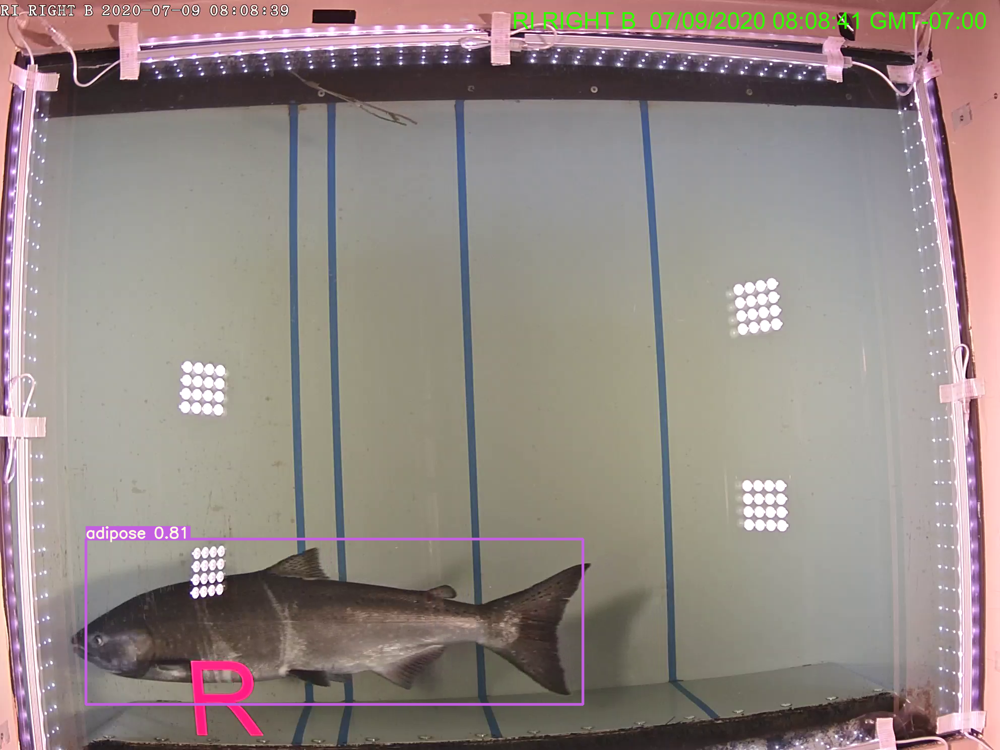

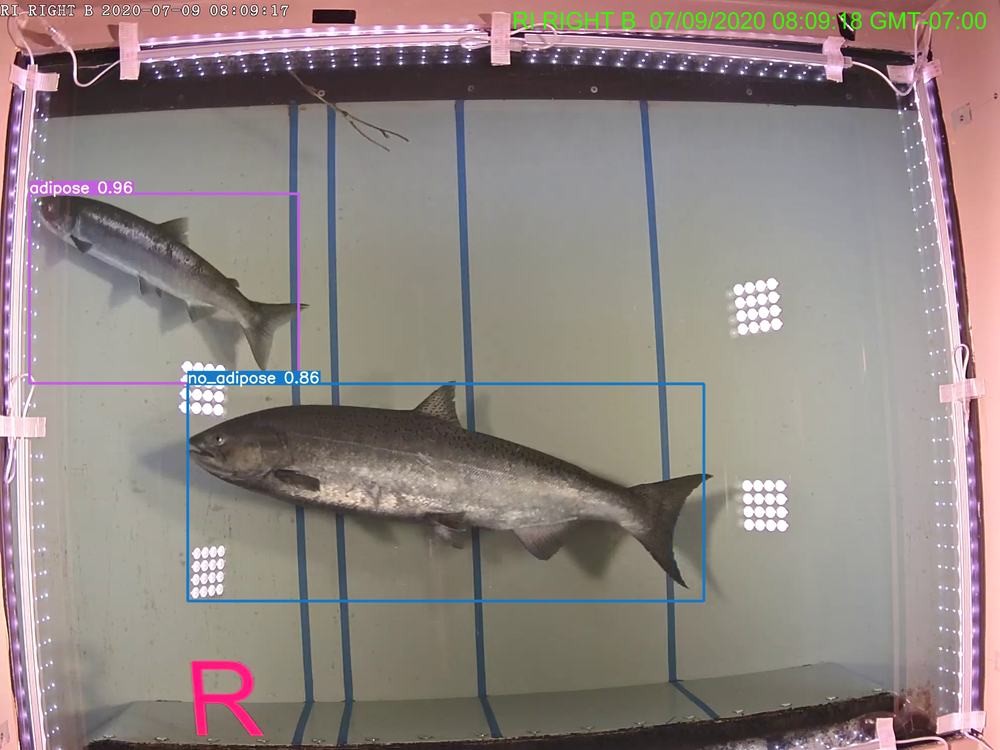

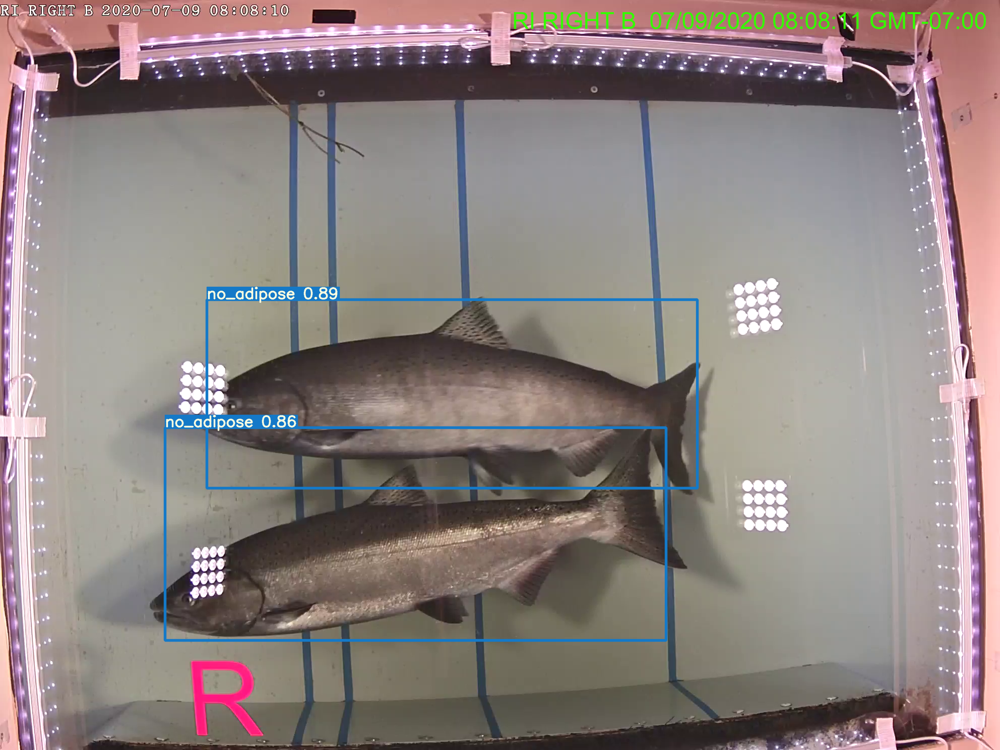

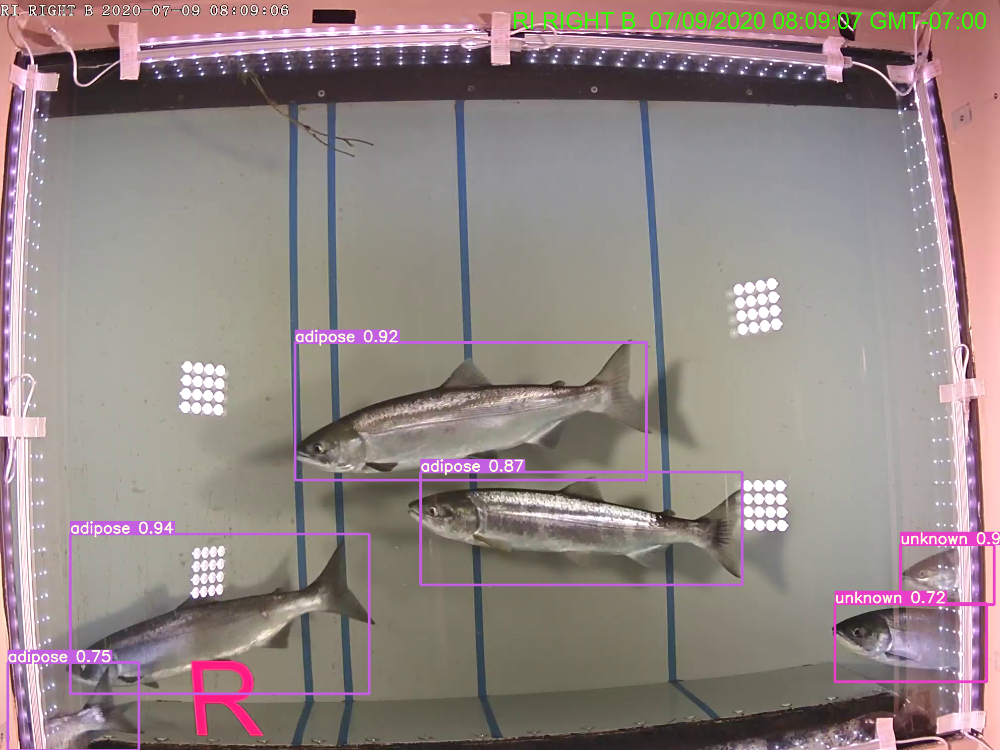

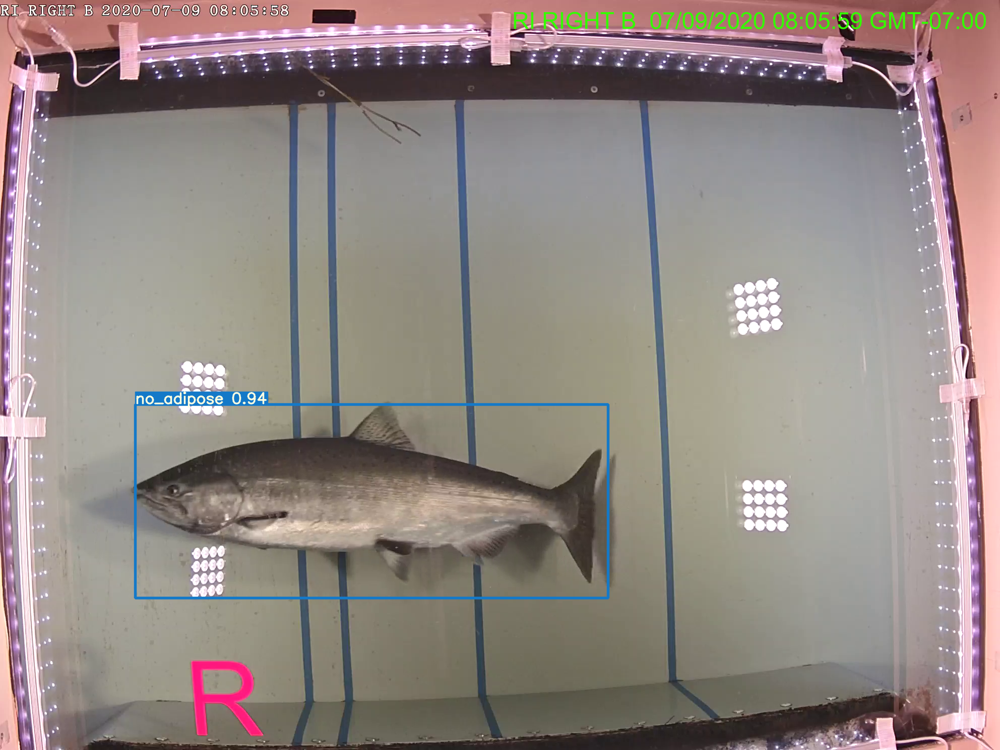

In [18]:
#display inference on test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/e*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

### inference with tricky images

In [20]:
# Run the pre-trained model with the tricky images
%cd /content/yolov5/
!python detect.py --weights weights/RIS_yolov5_e100.pt --img 416 --conf 0.4 --source ./test/test_tricky_images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='./test/test_tricky_images', update=False, view_img=False, weights='weights/RIS_yolov5_e100.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

image 1/13 test/test_tricky_images/t_14h00m05s175.png: 352x416 5 adiposes, 1 no_adiposes, Done. (0.022s)
image 2/13 test/test_tricky_images/t_14h02m48s843.png: 352x416 1 unknowns, 3 adiposes, 1 no_adiposes, Done. (0.020s)
image 3/13 test/test_tricky_images/t_14h03m12s372.png: 352x416 1 unknowns, 5 adiposes, Done. (0.021s)
image 4/13 test/test_tricky_images/t_14h04m08s215.png: 352x416 6 adiposes, 1 no_adiposes, Done. (0.020s)
image 5/13 test/test_tricky_images/t_15h03m39s652.png: 352x416 2 adiposes, Done. (0.022s)
image 6/13 test/test_tricky_images/t_15h03m59s347.png: 352x416 1 unknowns, 3 adiposes, 2 no_adiposes, Done. (0.021s)
imag

In [21]:
# Copy the outputs before they are over-written
%cp ./inference/output/t*  /content/gdrive/My\ Drive/Colab_fish/inference_output/

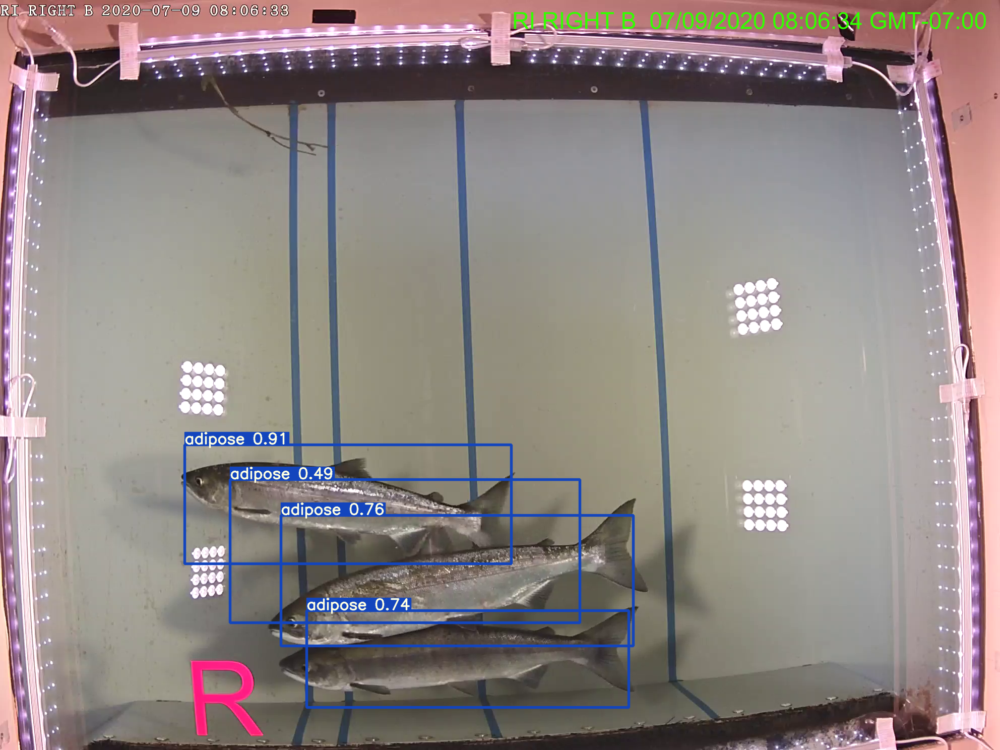

In [ ]:
#display inference on test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/t*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

### inference with video

In [ ]:
%%time
%cd /content/yolov5/
!python detect.py --weights weights/RIS_yolov5_e100.pt --img 416 --conf 0.6 --source ./test/test_video/
# 1528 frames

# NOTE! This is not the original detect.py output!! I modified it to print the predictions in order to explore
# methods of registering counts and tracking fish from frame to frame. This work is not completed.
#
# What I did find is that the predictions each have 6 values, e.g.:
#   [146.00000,   0.00000, 780.00000, 387.00000,   0.91357,   0.00000]
#   which are   bbox, bbox, bbox, bbox,  CONFIDENCE, CLASS
#   where CONFIDENCE is the level of confidence in the prediction and CLASS is the class predicted

Streaming output truncated to the last 5000 lines.

[tensor([[3.82000e+02, 9.14000e+02, 8.86000e+02, 1.07800e+03, 9.52194e-01, 1.00000e+00],
        [9.92000e+02, 5.34000e+02, 1.48000e+03, 7.30000e+02, 9.40916e-01, 1.00000e+00],
        [1.01000e+03, 7.71000e+02, 1.64200e+03, 1.02000e+03, 7.39281e-01, 1.00000e+00],
        [1.33200e+03, 6.41000e+02, 1.79500e+03, 9.02000e+02, 6.72939e-01, 1.00000e+00]], device='cuda:0')]


video 1/1 (695/1528) test/test_video/fish_183751_trim_v1.mp4: 288x416 4 adiposes, Done. (0.012s)

[tensor([[3.79000e+02, 9.12000e+02, 8.85000e+02, 1.07700e+03, 9.42465e-01, 1.00000e+00],
        [9.90000e+02, 5.41000e+02, 1.46600e+03, 7.34000e+02, 9.25537e-01, 1.00000e+00],
        [9.48000e+02, 7.65000e+02, 1.61500e+03, 1.01600e+03, 8.13514e-01, 1.00000e+00],
        [1.23300e+03, 6.52000e+02, 1.80600e+03, 9.46000e+02, 7.28607e-01, 1.00000e+00]], device='cuda:0')]


video 1/1 (696/1528) test/test_video/fish_183751_trim_v1.mp4: 288x416 3 adiposes, Done. (0.013s)

[ten

In [ ]:
# Copy the outputs before they are over-written
%cp ./inference/output/f*  /content/gdrive/My\ Drive/Colab_fish/inference_output/

# End of Notebook

## Acknowledgements
Special thank you to:

- [Chelan County PUD, WA] (https://www.chelanpud.org/environment/fish-and-wildlife/fish-counts) for providing fish images

- Team [Roboflow](https://roboflow.ai) for providing the image augmentation, notebook templates and various tips
